## Speech Emotion Recognition

Basic Algorithms used:


In [58]:
import os
import re
import librosa
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import Audio
from keras import layers
from keras import models
from tensorflow.keras import utils
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from tensorflow.python.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import itertools

In [3]:
Ravdess="/kaggle/input/speech-emotion-recognition-en/Ravdess/audio_speech_actors_01-24"
Crema="/kaggle/input/speech-emotion-recognition-en/Crema"
Savee="/kaggle/input/speech-emotion-recognition-en/Savee"
Tess="/kaggle/input/speech-emotion-recognition-en/Tess"


## Data Preparation

**Ravdess**

In [4]:
ravdess_directory_list = os.listdir(Ravdess)

emotion_df = []

for dir in ravdess_directory_list:
    actor = os.listdir(os.path.join(Ravdess, dir))
    for wav in actor:
        info = wav.partition(".wav")[0].split("-")
        emotion = int(info[2])
        emotion_df.append((emotion, os.path.join(Ravdess, dir, wav)))

In [5]:
Ravdess_df = pd.DataFrame.from_dict(emotion_df)
Ravdess_df.rename(columns={1 : "Path", 0 : "Emotion"}, inplace=True)
Ravdess_df.Emotion.replace({1:'neutral', 2:'neutral', 3:'happy', 4:'sad', 5:'angry', 6:'fear', 7:'disgust', 8:'surprise'}, inplace=True)
Ravdess_df.head()

/tmp/ipykernel_34/249234121.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  Ravdess_df.Emotion.replace({1:'neutral', 2:'neutral', 3:'happy', 4:'sad', 5:'angry', 6:'fear', 7:'disgust', 8:'surprise'}, inplace=True)


,Emotion,Path
0,surprise,/kaggle/input/speech-emotion-recognition-en/Ra...
1,neutral,/kaggle/input/speech-emotion-recognition-en/Ra...
2,disgust,/kaggle/input/speech-emotion-recognition-en/Ra...
3,disgust,/kaggle/input/speech-emotion-recognition-en/Ra...
4,neutral,/kaggle/input/speech-emotion-recognition-en/Ra...


Crema

In [6]:
emotion_df = []

for wav in os.listdir(Crema):
    info = wav.partition(".wav")[0].split("_")
    if info[2] == 'SAD':
        emotion_df.append(("sad", Crema + "/" + wav))
    elif info[2] == 'ANG':
        emotion_df.append(("angry", Crema + "/" + wav))
    elif info[2] == 'DIS':
        emotion_df.append(("disgust", Crema + "/" + wav))
    elif info[2] == 'FEA':
        emotion_df.append(("fear", Crema + "/" + wav))
    elif info[2] == 'HAP':
        emotion_df.append(("happy", Crema + "/" + wav))
    elif info[2] == 'NEU':
        emotion_df.append(("neutral", Crema + "/" + wav))
    else:
        emotion_df.append(("unknown", Crema + "/" + wav))


Crema_df = pd.DataFrame.from_dict(emotion_df)
Crema_df.rename(columns={1 : "Path", 0 : "Emotion"}, inplace=True)

Crema_df.head()

,Emotion,Path
0,disgust,/kaggle/input/speech-emotion-recognition-en/Cr...
1,happy,/kaggle/input/speech-emotion-recognition-en/Cr...
2,happy,/kaggle/input/speech-emotion-recognition-en/Cr...
3,disgust,/kaggle/input/speech-emotion-recognition-en/Cr...
4,disgust,/kaggle/input/speech-emotion-recognition-en/Cr...


In [7]:
tess_directory_list = os.listdir(Tess)

emotion_df = []

for dir in tess_directory_list:
    for wav in os.listdir(os.path.join(Tess, dir)):
        info = wav.partition(".wav")[0].split("_")
        emo = info[2]
        if emo == "ps":
            emotion_df.append(("surprise", os.path.join(Tess, dir, wav)))
        else:
            emotion_df.append((emo, os.path.join(Tess, dir, wav)))


Tess_df = pd.DataFrame.from_dict(emotion_df)
Tess_df.rename(columns={1 : "Path", 0 : "Emotion"}, inplace=True)

Tess_df.head()

,Emotion,Path
0,fear,/kaggle/input/speech-emotion-recognition-en/Te...
1,fear,/kaggle/input/speech-emotion-recognition-en/Te...
2,fear,/kaggle/input/speech-emotion-recognition-en/Te...
3,fear,/kaggle/input/speech-emotion-recognition-en/Te...
4,fear,/kaggle/input/speech-emotion-recognition-en/Te...


In [8]:
savee_directiory_list = os.listdir(Savee)

emotion_df = []

for wav in savee_directiory_list:
    info = wav.partition(".wav")[0].split("_")[1].replace(r"[0-9]", "")
    emotion = re.split(r"[0-9]", info)[0]
    if emotion=='a':
        emotion_df.append(("angry", Savee + "/" + wav))
    elif emotion=='d':
        emotion_df.append(("disgust", Savee + "/" + wav))
    elif emotion=='f':
        emotion_df.append(("fear", Savee + "/" + wav))
    elif emotion=='h':
        emotion_df.append(("happy", Savee + "/" + wav))
    elif emotion=='n':
        emotion_df.append(("neutral", Savee + "/" + wav))
    elif emotion=='sa':
        emotion_df.append(("sad", Savee + "/" + wav))
    else:
        emotion_df.append(("surprise", Savee + "/" + wav))


Savee_df = pd.DataFrame.from_dict(emotion_df)
Savee_df.rename(columns={1 : "Path", 0 : "Emotion"}, inplace=True)

Savee_df.head()

,Emotion,Path
0,happy,/kaggle/input/speech-emotion-recognition-en/Sa...
1,fear,/kaggle/input/speech-emotion-recognition-en/Sa...
2,happy,/kaggle/input/speech-emotion-recognition-en/Sa...
3,disgust,/kaggle/input/speech-emotion-recognition-en/Sa...
4,angry,/kaggle/input/speech-emotion-recognition-en/Sa...


Concatanating all datasets

In [9]:
# Let's concat all datasets together for doing some analysis
df = pd.concat([Ravdess_df, Crema_df, Tess_df, Savee_df], axis=0)
df.shape

(12162, 2)

In [10]:
df.head()

,Emotion,Path
0,surprise,/kaggle/input/speech-emotion-recognition-en/Ra...
1,neutral,/kaggle/input/speech-emotion-recognition-en/Ra...
2,disgust,/kaggle/input/speech-emotion-recognition-en/Ra...
3,disgust,/kaggle/input/speech-emotion-recognition-en/Ra...
4,neutral,/kaggle/input/speech-emotion-recognition-en/Ra...


## EDA

Value Counts

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: title={'center': 'Emotion Counts'}, xlabel='Emotion', ylabel='Count'>

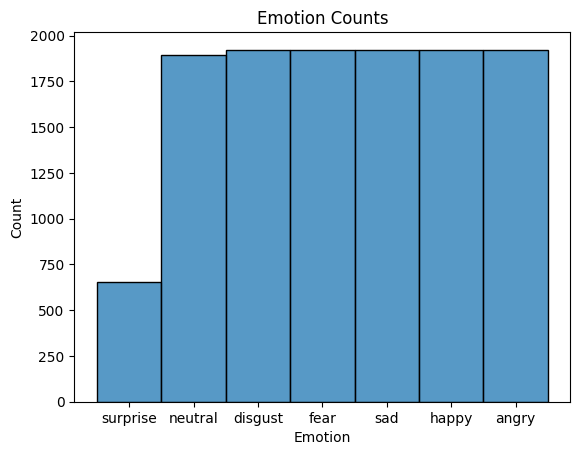

In [11]:
plt.title("Emotion Counts")
sns.histplot(x=df["Emotion"])


## Data Visualization

Waveplot

In [12]:
def waveplot(data, sr, e):
    plt.figure(figsize=(10,3))
    plt.title(f'Emotion: {e}')
    librosa.display.waveshow(data, sr=sr)
    plt.show()

There are two types of waveplots: Amplitude vs Sample Rate, and vs Time.

Documentation: when the plot spans a time interval of less than max_points / sr (by default, 1/2 second), the samples-based view is used, and otherwise a downsampled amplitude envelope is used

Spectrogram

In [13]:
def spectrogram(data, sr, e):
    X=librosa.stft(data)
    Xdb=librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(12,3))
    plt.title(f'Spectrogram of {e} emotion')
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
    plt.colorbar()

For Each Emotion:


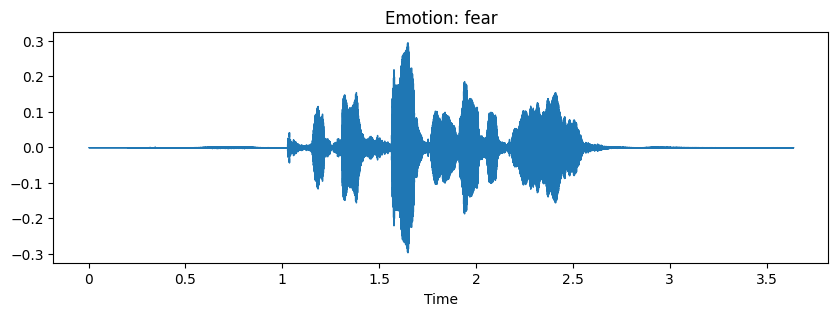

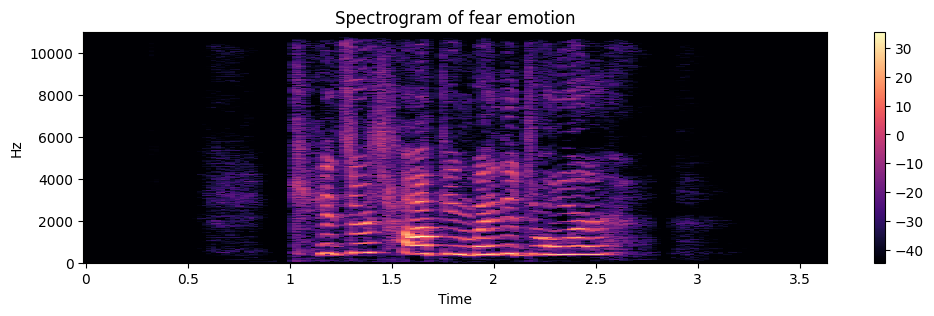

In [14]:
emotion='fear'
path=np.array(df.Path[df.Emotion==emotion])[1]
data, sr = librosa.load(path)
waveplot(data, sr, emotion)
spectrogram(data, sr, emotion)
Audio(path)

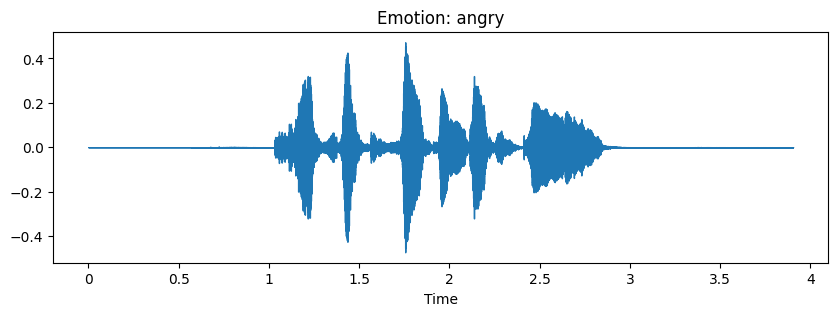

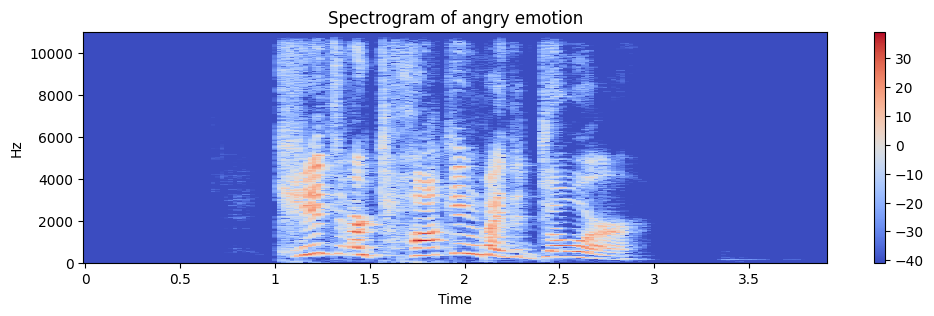

In [15]:
emotion='angry'
path=np.array(df.Path[df.Emotion==emotion])[1]
data, sr = librosa.load(path)
waveplot(data, sr, emotion)
spectrogram(data, sr, emotion)
Audio(path)

## Data Augmentation

These features are added to ensure that model is trained to handle if the test/valisation data has some noise or stretching

Features to be applied:
* Noise 
* Stretching
* Shifting
* Pitching

In [16]:
def noise(data, random=False, rate=0.035, threshold=0.075):
    noise_amp = rate*np.random.uniform()*np.amax(data)
    data = data + noise_amp*np.random.normal(size=data.shape[0])
    return data

def stretch(data, rate=0.8):
    return librosa.effects.time_stretch(data, rate=rate)

def shift(data, rate=1000):
    shift_range = int(np.random.uniform(low=-5, high= 5)*rate)
    return librosa.effects.roll(data, shift_range)

def pitch(data, sr, n_steps=2, random=False):
    return librosa.effects.pitch_shift(data, sr=sr, n_steps=n_steps)

Example applied on audio

In [17]:
path=df[df["Emotion"] == "happy"]["Path"].iloc[1]
data, sr=librosa.load(path)

simple

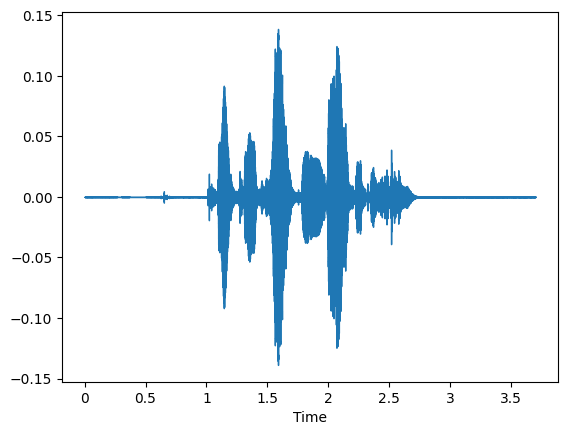

In [18]:
librosa.display.waveshow(data, sr=sr)
Audio(path)

noise

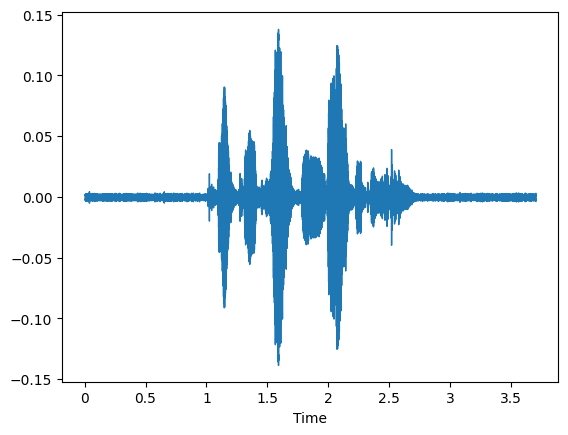

In [19]:
noised_data = noise(data)
librosa.display.waveshow(noised_data, sr=sr)
Audio(noised_data, rate=sr)

stretch

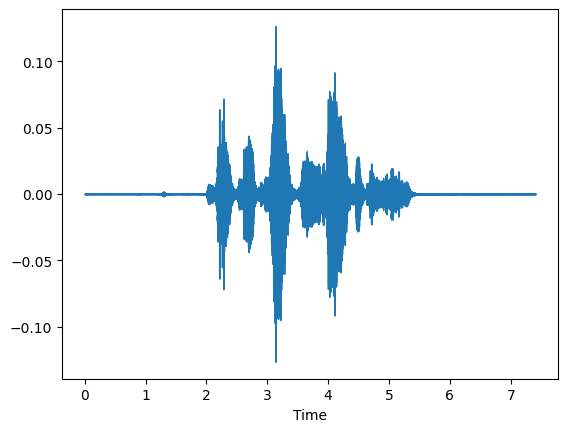

In [20]:
stretched_data = stretch(data, rate=0.5)
librosa.display.waveshow(stretched_data, sr=sr)
Audio(stretched_data, rate=sr)

pitch

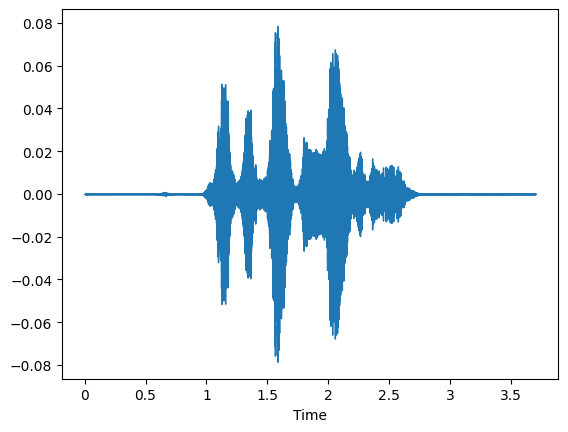

In [21]:
pitched_data = pitch(data, sr=100)
librosa.display.waveshow(pitched_data, sr=sr)
Audio(pitched_data, rate=sr)

## Feature Extraction

In [22]:
n_fft = 2048
hop_length = 512
def chunks(data, frame_length, hop_length):
    for i in range(0, len(data), hop_length):
        yield data[i:i+frame_length]

# Zero Crossing Rate
def zcr(data, frame_length=2048, hop_length=512):
    zcr = librosa.feature.zero_crossing_rate(y=data, frame_length=frame_length, hop_length=hop_length)
    return np.squeeze(zcr)


def energy(data, frame_length=2048, hop_length=512):
    en = np.array([np.sum(np.power(np.abs(data[hop:hop+frame_length]), 2)) for hop in range(0, data.shape[0], hop_length)])
    return en / frame_length


def rmse(data, frame_length=2048, hop_length=512):
    rmse = librosa.feature.rms(y=data, frame_length=frame_length, hop_length=hop_length)
    return np.squeeze(rmse)


def entropy_of_energy(data, frame_length=2048, hop_length=512):
    energies = energy(data, frame_length, hop_length)
    energies /= np.sum(energies)

    entropy = 0.0
    entropy -= energies * np.log2(energies)
    return entropy


def spc(data, sr, frame_length=2048, hop_length=512):
    spectral_centroid = librosa.feature.spectral_centroid(y=data, sr=sr, n_fft=frame_length, hop_length=hop_length)
    return np.squeeze(spectral_centroid)


# def spc_entropy(data, sr):
#     spc_en = spectral_entropy(data, sf=sr, method="fft")
#     return spc_en

def spc_flux(data):
    isSpectrum = data.ndim == 1
    if isSpectrum:
        data = np.expand_dims(data, axis=1)

    X = np.c_[data[:, 0], data]
    af_Delta_X = np.diff(X, 1, axis=1)
    vsf = np.sqrt((np.power(af_Delta_X, 2).sum(axis=0))) / X.shape[0]

    return np.squeeze(vsf) if isSpectrum else vsf


def spc_rollof(data, sr, frame_length=2048, hop_length=512):
    spcrollof = librosa.feature.spectral_rolloff(y=data, sr=sr, n_fft=frame_length, hop_length=hop_length)
    return np.squeeze(spcrollof)


def chroma_stft(data, sr, frame_length=2048, hop_length=512, flatten: bool = True):
    stft = np.abs(librosa.stft(data))
    chroma_stft = librosa.feature.chroma_stft(S=stft, sr=sr)
    return np.squeeze(chroma_stft.T) if not flatten else np.ravel(chroma_stft.T)


def mel_spc(data, sr, frame_length=2048, hop_length=512, flatten: bool = True):
    mel = librosa.feature.melspectrogram(y=data, sr=sr)
    return np.squeeze(mel.T) if not flatten else np.ravel(mel.T)

def mfcc(data, sr, frame_length=2048, hop_length=512, flatten: bool = True):
    mfcc_feature = librosa.feature.mfcc(y=data, sr=sr)
    return np.squeeze(mfcc_feature.T) if not flatten else np.ravel(mfcc_feature.T)

In [23]:
path = np.array(df["Path"])[658]
data, sample_rate = librosa.load(path, duration=2.5, offset=0.6)
len(data)

55125

In [24]:
print("ZCR: ", zcr(data).shape)
print("Energy: ", energy(data).shape)
print("Entropy of Energy :", entropy_of_energy(data).shape)
print("RMS :", rmse(data).shape)
print("Spectral Centroid :", spc(data, sr).shape)
# print("Spectral Entropy: ", spc_entropy(data, sampling_rate).shape)
print("Spectral Flux: ", spc_flux(data).shape)
print("Spectral Rollof: ", spc_rollof(data, sr).shape)
print("Chroma STFT: ", chroma_stft(data, sr).shape)
print("MelSpectrogram: ", mel_spc(data, sr).shape)
print("MFCC: ", mfcc(data, sr).shape)



ZCR:  (108,)
Energy:  (108,)
Entropy of Energy : (108,)
RMS : (108,)
Spectral Centroid : (108,)
Spectral Flux:  ()
Spectral Rollof:  (108,)
Chroma STFT:  (1296,)
MelSpectrogram:  (13824,)
MFCC:  (2160,)


We will only use ZCR, RMS and MFCC

In [25]:
def extract_features(data, sr, frame_length=2048, hop_length=512):
    result = np.array([])
    result = np.hstack((result,
                        zcr(data, frame_length, hop_length),
                        rmse(data, frame_length, hop_length),
                        mfcc(data, sr, frame_length, hop_length)))
    return result


to trim the starting and ending of audio files which do not have any sound, we use duration and offset

In [26]:
def get_features(path, duration=2.5, offset=0.6):
    data, sr= librosa.load(path, duration=duration, offset=offset)
    res1=extract_features(data, sr)
    result=np.array(res1)
    
    noised_data=noise(data, random=True)
    res2=extract_features(noised_data, sr)
    result=np.vstack((result, res2))
    
    pitched_data = pitch(data, sr, random=True)
    res3=extract_features(pitched_data, sr)
    result=np.vstack((result, res3))
    
    only_noise_data = noise(data, random=True)
    noise_and_pitch_data = pitch(only_noise_data,sr, random=True)
    res3=extract_features(noise_and_pitch_data, sr)
    result=np.vstack((result, res3))
    
    return result 

here we extract features from all input audio files, using get_features method, which calls extract_features on the augmented data, which extracts features like mfcc, zcr, etc from the augmented data, and it is finally stored in X.

Y stores the label for each corresponding X values.

This kinda creates a dataset with input values(X) being the features extracted from the augmented audio files, and output values(Y) storing the labels associated with it.

In [27]:
X,Y=[],[]
for path, emotion, status in zip(df.Path, df.Emotion, range(df.Path.shape[0])):
    features=get_features(path)
    if status % 100 == 0:
        print(f'{status} samples have been processed, out of {df.shape[0]} samples')
    for ele in features:
        X.append(ele)
        Y.append(emotion)
print("Done")

0 samples have been processed, out of 12162 samples
100 samples have been processed, out of 12162 samples
200 samples have been processed, out of 12162 samples
300 samples have been processed, out of 12162 samples
400 samples have been processed, out of 12162 samples
500 samples have been processed, out of 12162 samples
600 samples have been processed, out of 12162 samples
700 samples have been processed, out of 12162 samples
800 samples have been processed, out of 12162 samples
900 samples have been processed, out of 12162 samples
1000 samples have been processed, out of 12162 samples
1100 samples have been processed, out of 12162 samples
1200 samples have been processed, out of 12162 samples
1300 samples have been processed, out of 12162 samples
1400 samples have been processed, out of 12162 samples
1500 samples have been processed, out of 12162 samples
1600 samples have been processed, out of 12162 samples
1700 samples have been processed, out of 12162 samples
1800 samples have been

In [28]:
features_path = "./features.csv"

In [29]:
extracted_df=pd.DataFrame(X)
extracted_df["labels"]=Y
extracted_df.to_csv(features_path, index=False)
extracted_df.head()

,0,1,2,3,4,5,6,7,8,9,...,2367,2368,2369,2370,2371,2372,2373,2374,2375,labels
0,0.343750,0.479492,0.573730,0.458008,0.375488,0.301758,0.269043,0.255371,0.251465,0.251953,...,-1.517690,-1.716483,-1.599310,-1.234609,-0.693198,-0.038982,0.675206,1.405603,2.112303,surprise
1,0.259277,0.388672,0.507324,0.495605,0.480957,0.462891,0.456055,0.450195,0.456543,0.461914,...,-3.722388,-2.970527,-4.271173,-0.735353,-1.232149,0.524320,-1.584156,2.312940,4.711834,surprise
2,0.316406,0.435547,0.553223,0.469727,0.387695,0.336426,0.288574,0.278809,0.274414,0.280762,...,1.678242,2.734655,3.698855,4.366373,4.678908,4.730829,4.683908,4.650658,4.628045,surprise
3,0.244629,0.371582,0.479980,0.473145,0.456055,0.437012,0.430664,0.421875,0.423828,0.422363,...,13.873913,4.550300,-1.209897,-4.845686,6.344935,0.750502,5.758230,1.600519,5.596057,surprise
4,0.437500,0.659668,0.862305,0.878906,0.865234,0.847168,0.845703,0.827637,0.835938,0.667969,...,2.586417,2.746852,2.223276,0.986916,-0.730695,-2.530884,-4.002834,-4.849372,-4.929744,neutral


In [30]:
extracted_df = pd.read_csv(features_path)
extracted_df.shape

(48648, 2377)

In [31]:
# Fill NaN with 0
extracted_df = extracted_df.fillna(0)
print(extracted_df.isna().any())
extracted_df.shape


0         False
1         False
2         False
3         False
4         False
          ...  
2372      False
2373      False
2374      False
2375      False
labels    False
Length: 2377, dtype: bool


(48648, 2377)

In [32]:
extracted_df.head()

,0,1,2,3,4,5,6,7,8,9,...,2367,2368,2369,2370,2371,2372,2373,2374,2375,labels
0,0.343750,0.479492,0.573730,0.458008,0.375488,0.301758,0.269043,0.255371,0.251465,0.251953,...,-1.517690,-1.716483,-1.599310,-1.234609,-0.693198,-0.038982,0.675206,1.405603,2.112303,surprise
1,0.259277,0.388672,0.507324,0.495605,0.480957,0.462891,0.456055,0.450195,0.456543,0.461914,...,-3.722388,-2.970527,-4.271173,-0.735353,-1.232149,0.524320,-1.584156,2.312940,4.711834,surprise
2,0.316406,0.435547,0.553223,0.469727,0.387695,0.336426,0.288574,0.278809,0.274414,0.280762,...,1.678242,2.734655,3.698855,4.366373,4.678908,4.730829,4.683908,4.650658,4.628045,surprise
3,0.244629,0.371582,0.479980,0.473145,0.456055,0.437012,0.430664,0.421875,0.423828,0.422363,...,13.873913,4.550300,-1.209897,-4.845686,6.344935,0.750502,5.758230,1.600519,5.596057,surprise
4,0.437500,0.659668,0.862305,0.878906,0.865234,0.847168,0.845703,0.827637,0.835938,0.667969,...,2.586417,2.746852,2.223276,0.986916,-0.730695,-2.530884,-4.002834,-4.849372,-4.929744,neutral


In [33]:
# Inspect the DataFrame
print(extracted_df.head())

# Check column names and data types
print(extracted_df.info())


          0         1         2         3         4         5         6  \
0  0.343750  0.479492  0.573730  0.458008  0.375488  0.301758  0.269043   
1  0.259277  0.388672  0.507324  0.495605  0.480957  0.462891  0.456055   
2  0.316406  0.435547  0.553223  0.469727  0.387695  0.336426  0.288574   
3  0.244629  0.371582  0.479980  0.473145  0.456055  0.437012  0.430664   
4  0.437500  0.659668  0.862305  0.878906  0.865234  0.847168  0.845703   

          7         8         9  ...       2367      2368      2369      2370  \
0  0.255371  0.251465  0.251953  ...  -1.517690 -1.716483 -1.599310 -1.234609   
1  0.450195  0.456543  0.461914  ...  -3.722388 -2.970527 -4.271173 -0.735353   
2  0.278809  0.274414  0.280762  ...   1.678242  2.734655  3.698855  4.366373   
3  0.421875  0.423828  0.422363  ...  13.873913  4.550300 -1.209897 -4.845686   
4  0.827637  0.835938  0.667969  ...   2.586417  2.746852  2.223276  0.986916   

       2371      2372      2373      2374      2375    labels 

In [34]:
X=extracted_df.drop(labels="labels", axis=1)
Y=extracted_df["labels"]

In [35]:
le=LabelEncoder()
Y=utils.to_categorical(le.fit_transform(Y))
le.classes_

array(['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise'],
      dtype=object)

In [36]:
Y

array([[0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [37]:
X_train, X_test, y_train, y_test = train_test_split(X,Y,test_size=0.2, random_state=42, shuffle=True)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((38918, 2376), (9730, 2376), (38918, 7), (9730, 7))

In [38]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42, shuffle=True)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((35026, 2376), (3892, 2376), (35026, 7), (3892, 7))

## Standardize Data

In [39]:
# Standardize data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
X_val = scaler.transform(X_val)
X_train.shape, X_test.shape, X_val.shape, y_train.shape, y_test.shape, y_val.shape

((35026, 2376), (9730, 2376), (3892, 2376), (35026, 7), (9730, 7), (3892, 7))

In [40]:
# We have to use 1-dimensional CNN which need specifical shape:
X_train = np.expand_dims(X_train, axis=2)
X_val = np.expand_dims(X_val, axis=2)
X_test = np.expand_dims(X_test, axis=2)
X_train.shape

(35026, 2376, 1)

In [41]:
earlystopping = EarlyStopping(monitor ="val_acc",
                              mode = 'auto', patience = 5,
                              restore_best_weights = True)


In [42]:
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc',
                                            patience=3,
                                            verbose=1,
                                            factor=0.5,
                                            min_lr=0.00001)

In [43]:

import tensorflow.keras.backend as K
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [60]:
model = models.Sequential()
model.add(layers.Conv1D(512, kernel_size=5, strides=1,
                        padding="same", activation="relu",
                        input_shape=(X_train.shape[1], 1)))
model.add(layers.BatchNormalization())
model.add(layers.MaxPool1D(pool_size=5, strides=2, padding="same"))

model.add(layers.Conv1D(512, kernel_size=5, strides=1,
                        padding="same", activation="relu"))
model.add(layers.BatchNormalization())
model.add(layers.MaxPool1D(pool_size=5, strides=2, padding="same"))

model.add(layers.Conv1D(256, kernel_size=5, strides=1,
                        padding="same", activation="relu"))
model.add(layers.BatchNormalization())
model.add(layers.MaxPool1D(pool_size=5, strides=2, padding="same"))

model.add(layers.Conv1D(256, kernel_size=3, strides=1, padding='same', activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))

model.add(layers.Conv1D(128, kernel_size=3, strides=1, padding='same', activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling1D(pool_size=3, strides = 2, padding = 'same'))

model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.Dense(7, activation="softmax"))

optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.001)

model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["acc", f1_m])


In [61]:
model.summary()

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_45 (Conv1D)              │ (None, 2376, 512)      │         3,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_54          │ (None, 2376, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_45 (MaxPooling1D) │ (None, 1188, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_46 (Conv1D)              │ (None, 1188, 512)      │     1,311,232 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_55          │ (None, 1188, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_46 (MaxPooling1D) │ (None, 594, 512)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_47 (Conv1D)              │ (None, 594, 256)       │       655,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_56          │ (None, 594, 256)       │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_47 (MaxPooling1D) │ (None, 297, 256)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_48 (Conv1D)              │ (None, 297, 256)       │       196,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_57          │ (None, 297, 256)       │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_48 (MaxPooling1D) │ (None, 149, 256)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_49 (Conv1D)              │ (None, 149, 128)       │        98,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_58          │ (None, 149, 128)       │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_49 (MaxPooling1D) │ (None, 75, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_9 (Flatten)             │ (None, 9600)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 512)            │     4,915,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_59          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 7)              │         3,591 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,193,223 (27.44 MB)

 Trainable params: 7,188,871 (27.42 MB)

 Non-trainable params: 4,352 (17.00 KB)

In [46]:
EPOCHS = 50
batch_size = 64

In [63]:

from keras.callbacks import ReduceLROnPlateau

# Define the ReduceLROnPlateau callback
reduce_lr = ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.0001)

# Train the model with ReduceLROnPlateau callback
history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                    epochs=EPOCHS, batch_size=batch_size,
                    callbacks=[earlystopping, reduce_lr])



# # Train the model with ReduceLROnPlateau callback
# history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
#                     epochs=EPOCHS, batch_size=batch_size,
#                     callbacks=[earlystopping, learning_rate_reduction])


Epoch 1/50
548/548 ━━━━━━━━━━━━━━━━━━━━ 71s 129ms/step - acc: 0.5648 - f1_m: 0.5192 - loss: 1.1253 - val_acc: 0.5126 - val_f1_m: 0.4971 - val_loss: 1.3975 - learning_rate: 0.0010
Epoch 2/50
548/548 ━━━━━━━━━━━━━━━━━━━━ 70s 128ms/step - acc: 0.6223 - f1_m: 0.5876 - loss: 0.9831 - val_acc: 0.6095 - val_f1_m: 0.5828 - val_loss: 1.0458 - learning_rate: 0.0010
Epoch 3/50
548/548 ━━━━━━━━━━━━━━━━━━━━ 82s 128ms/step - acc: 0.6830 - f1_m: 0.6599 - loss: 0.8371 - val_acc: 0.6418 - val_f1_m: 0.6348 - val_loss: 0.9704 - learning_rate: 0.0010
Epoch 4/50
548/548 ━━━━━━━━━━━━━━━━━━━━ 70s 128ms/step - acc: 0.7310 - f1_m: 0.7147 - loss: 0.7194 - val_acc: 0.6092 - val_f1_m: 0.6042 - val_loss: 1.1415 - learning_rate: 0.0010
Epoch 5/50
548/548 ━━━━━━━━━━━━━━━━━━━━ 70s 128ms/step - acc: 0.7835 - f1_m: 0.7767 - loss: 0.5842 - val_acc: 0.7012 - val_f1_m: 0.6894 - val_loss: 0.8290 - learning_rate: 0.0010
Epoch 6/50
548/548 ━━━━━━━━━━━━━━━━━━━━ 70s 128ms/step - acc: 0.8335 - f1_m: 0.8325 - loss: 0.4515 - val_

305/305 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - acc: 0.9459 - f1_m: 0.9464 - loss: 0.2417
Accuracy of our model on test data :  94.28571462631226 %


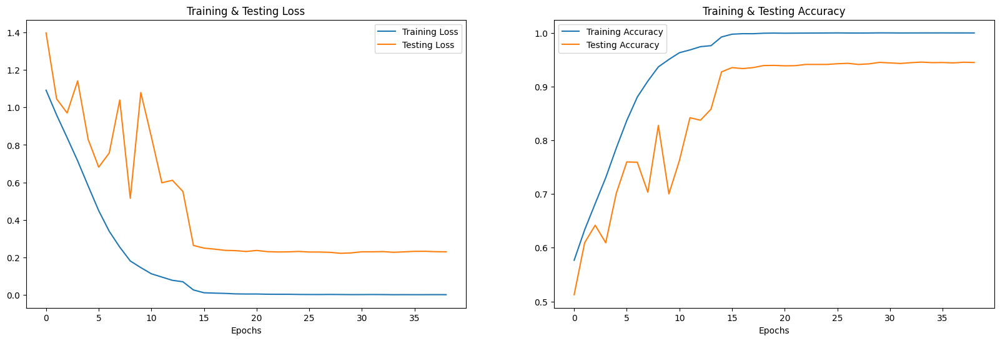

In [64]:
print("Accuracy of our model on test data : " , model.evaluate(X_test,y_test)[1]*100 , "%")

fig , ax = plt.subplots(1,2)
train_acc = history.history['acc']
train_loss = history.history['loss']
test_acc = history.history['val_acc']
test_loss = history.history['val_loss']

fig.set_size_inches(20,6)
ax[0].plot(train_loss, label = 'Training Loss')
ax[0].plot(test_loss , label = 'Testing Loss')
ax[0].set_title('Training & Testing Loss')
ax[0].legend()
ax[0].set_xlabel("Epochs")

ax[1].plot(train_acc, label = 'Training Accuracy')
ax[1].plot(test_acc , label = 'Testing Accuracy')
ax[1].set_title('Training & Testing Accuracy')
ax[1].legend()
ax[1].set_xlabel("Epochs")
plt.show()


In [65]:
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)
y_pred

305/305 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step


array([0, 0, 5, ..., 4, 5, 2])

In [66]:
y_check = np.argmax(y_test, axis=1)
y_check

array([0, 0, 1, ..., 4, 5, 2])

In [67]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true=y_check, y_pred=y_pred)

In [68]:
def plot_confusion_matrix(cm, classes,
                        normalize=False,
                        title='Confusion matrix',
                        cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
            horizontalalignment="center",
            color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Confusion matrix, without normalization
[[1423   19   11   18    9    1    3]
 [  23 1457   21   17   18   20    2]
 [  15   17 1401   32    9   26    5]
 [  37   20   27 1509   16    3    7]
 [  10   26   10    9 1482   21    0]
 [   9   27   19   11   18 1393    1]
 [   2    3    3    9    1    1  509]]


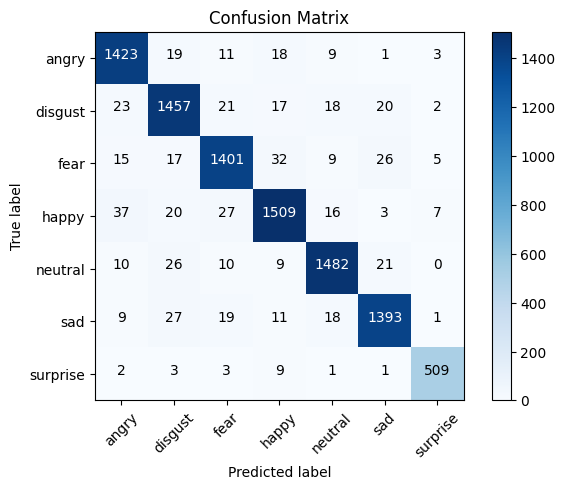

In [69]:
cm_plot_labels = ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']
plot_confusion_matrix(cm=cm, classes=cm_plot_labels, title='Confusion Matrix')

In [70]:
path_to_model = "./sertry2.h5"

model.save(path_to_model)

## Applying on input Audio

In [75]:
# Load the audio file
new_audio_path = "/kaggle/input/sad-audio-1/Man-Crying-and-Whimpering-Sound-Effect.wav"
new_data, new_sample_rate = librosa.load(new_audio_path, duration=2.5, offset=0.01)  # Adjust duration and offset as needed

# Extract features from the new audio file
new_features = extract_features(new_data, new_sample_rate)  # Assuming extract_features function is defined


In [76]:
from keras.models import load_model

# Load the trained model
path_to_model = "./sertry2.h5"  # Path to your trained model
loaded_model = load_model(path_to_model)


In [77]:
# Perform the prediction
new_features_reshaped = new_features.reshape(1, 2376, 1)

# Perform the prediction
predicted_emotion_probabilities = loaded_model.predict(new_features_reshaped)

# Get the predicted emotion label and confidence level
predicted_emotion_index = np.argmax(predicted_emotion_probabilities)
emotion_labels = ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

predicted_emotion_label = emotion_labels[predicted_emotion_index]
confidence_level = predicted_emotion_probabilities[0][predicted_emotion_index] * 100

print("Predicted emotion:", predicted_emotion_label)
print("Confidence level:", confidence_level, "%")
Audio(new_audio_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step
Predicted emotion: disgust
Confidence level: 100.0 %


for laughing audio

In [78]:
# Load the audio file
new_audio_path = "/kaggle/input/audioo/funniest-thing-001-85094.wav"
new_data, new_sample_rate = librosa.load(new_audio_path, duration=2.5, offset=0.1)  # Adjust duration and offset as needed

# Extract features from the new audio file
new_features = extract_features(new_data, new_sample_rate)  # Assuming extract_features function is defined

from keras.models import load_model

# Load the trained model
path_to_model = "./sertry2.h5"  # Path to your trained model
loaded_model = load_model(path_to_model)

new_features_reshaped = new_features.reshape(1, 2376, 1)

# Perform the prediction
predicted_emotion_probabilities = loaded_model.predict(new_features_reshaped)

# Get the predicted emotion label and confidence level
predicted_emotion_index = np.argmax(predicted_emotion_probabilities)
emotion_labels = ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

predicted_emotion_label = emotion_labels[predicted_emotion_index]
confidence_level = predicted_emotion_probabilities[0][predicted_emotion_index] * 100

print("Predicted emotion:", predicted_emotion_label)
print("Confidence level:", confidence_level, "%")

Audio(new_audio_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step
Predicted emotion: disgust
Confidence level: 100.0 %


for "wow" sound

In [74]:
# Load the audio file
wow_audio_path = "/kaggle/input/surprise-audio-1/wow-121578.wav"
new_data_1, new_sample_rate_1 = librosa.load(wow_audio_path, duration=2.5, offset=0.6)  # Adjust duration and offset as needed

# Extract features from the new audio file
new_features_1 = extract_features(new_data_1, new_sample_rate_1)  # Assuming extract_features function is defined

from keras.models import load_model

# Load the trained model
path_to_model = "./sertry2.h5"  # Path to your trained model
loaded_model = load_model(path_to_model)
new_features_reshaped_1 = new_features_1

# Perform the prediction
predicted_emotion_probabilities = loaded_model.predict(new_features_reshaped_1)

# Get the predicted emotion label and confidence level
predicted_emotion_index = np.argmax(predicted_emotion_probabilities)
emotion_labels = ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

predicted_emotion_label = emotion_labels[predicted_emotion_index]
confidence_level = predicted_emotion_probabilities[0][predicted_emotion_index] * 100

print("Predicted emotion:", predicted_emotion_label)
print("Confidence level:", confidence_level, "%")


ValueError: Exception encountered when calling Sequential.call().

[1mInvalid input shape for input Tensor("data:0", shape=(32,), dtype=float32). Expected shape (None, 2376, 1), but input has incompatible shape (32,)[0m

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=(32,), dtype=float32)
  • training=False
  • mask=None